# Ej. #3: Satisfacción con la Vida e Ingreso en Santiago de Chile

  * Autores: [Eduardo Graells-Garrido](https://twitter.com/carnby) (`egraells@udd.cl`), [Diego Caro](https://twitter.com/diegocaro) (`dcaro@udd.cl`). 
  * Curso: [Taller de Data Science @ IDS e Ingeniería UDD 2017](http://datagramas.cl/cursos/taller-ds/). 
  * Código: [Repositorio en github](https://github.com/diegocaro/tallerds).
 
## Introducción
 
En este ejercicio definiremos una función para visualizar datos geoespaciales utilizando *mapas de coropletas*. Esta técnica de visualización en inglés se llama [Choropleth Map](https://en.wikipedia.org/wiki/Choropleth_map), y es utilizada comúnmente para mostrar distribuciones de datos en mapas, adjudicando uno o más valores dentro de una escala a cada área del mapa. 

Como este tipo de visualización colorea cada área del mapa de acuerdo a su valor dentro de una distribución específica, es posible encontrar patrones geográficos. 

Los ejemplos más comunes son los mapas electorales y mapas de distribución de ingreso (o similares). Aquí hay un ejemplo de un mapa de coropletas por áreas censales de Santiago, mostrando la distribución de grupos socioeconómicos:

![](img/03_choropleth_stgo.jpg)

Ahora bien, hay que tener cuidado cuando se elaboran estos mapas porque debemos asegurarnos que las variables a analizar en distintas áreas sean relativas. Por ejemplo, no es lo mismo comparar cantidad de votos totales por un candidato en comunas, sino que deben compararse los porcentajes. Estas problemáticas las trabajaremos a lo largo del curso :)

## Bibliotecas y Configuración

Como siempre, lo primero que haremos será cargar todas las herramientas necesarias para ejecutar este notebook.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import numpy as np
import pysal as ps

# ésta es una biblioteca interna que usamos en el taller. está incluida en el repositorio, en la carpeta carpynter
from carpynter import choropleth

# estilo de los gráficos, configurado por seaborn
sns.set(context='poster', style='ticks', palette='Accent', font_scale=1.1)

# muestra los gráficos en línea
%matplotlib inline

## Comunas de Santiago

Queremos visualizar datos geoespaciales, y por ende lo primero que necesitamos es cargar la geografía. Para ello cargaremos los bordes comunales de acuerdo al [archivo Shapefile](https://es.wikipedia.org/wiki/Shapefile) de comunas que dispone la [Biblioteca del Congreso Nacional](https://www.bcn.cl/siit/mapas_vectoriales/index_html). Lo cargaremos usando GeoPandas:

In [2]:
municipalities = gpd.read_file('./input/shapefile_comunas/division_comunal.shp', crs={'init': 'epsg:5361'})
municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry
0,Región de La Araucanía,Malleco,Ercilla,170675.595438,48,14,9204,170675.595706,4.979025e+08,"POLYGON ((190393.2198999999 5794527.3661, 1904..."
1,Región de La Araucanía,Malleco,Lonquimay,346907.195437,49,14,9205,346907.195899,3.932854e+09,"POLYGON ((294265.5926999999 5781748.8701, 2943..."
2,Región de La Araucanía,Malleco,Los Sauces,169844.122286,48,14,9206,169844.122239,8.519730e+08,"POLYGON ((155495.1031999998 5804765.8096, 1555..."
3,Región de La Araucanía,Malleco,Lumaco,227705.219204,48,14,9207,227705.218806,1.112643e+09,"POLYGON ((159561.5301000001 5778741.6606, 1597..."
4,Región de La Araucanía,Malleco,Purén,137030.480474,48,14,9208,137030.480353,4.654760e+08,"POLYGON ((145272.5931000002 5804247.7066, 1453..."


Recordemos que el sistema de coordenadas [EPSG:5361](https://epsg.io/5361) que utiliza este archivo está en metros, no en latitud/longitud. Esto permite realizar operaciones como estimar el área de cada comuna:

In [3]:
municipalities['area_km2'] = municipalities.area / 1000000

Hagamos un mapa de coropletas donde las áreas más grandes se vean más claras, utilizando una escala de colores cuantitativa llamada [`magma`](https://cran.r-project.org/web/packages/viridis/vignettes/intro-to-viridis.html).

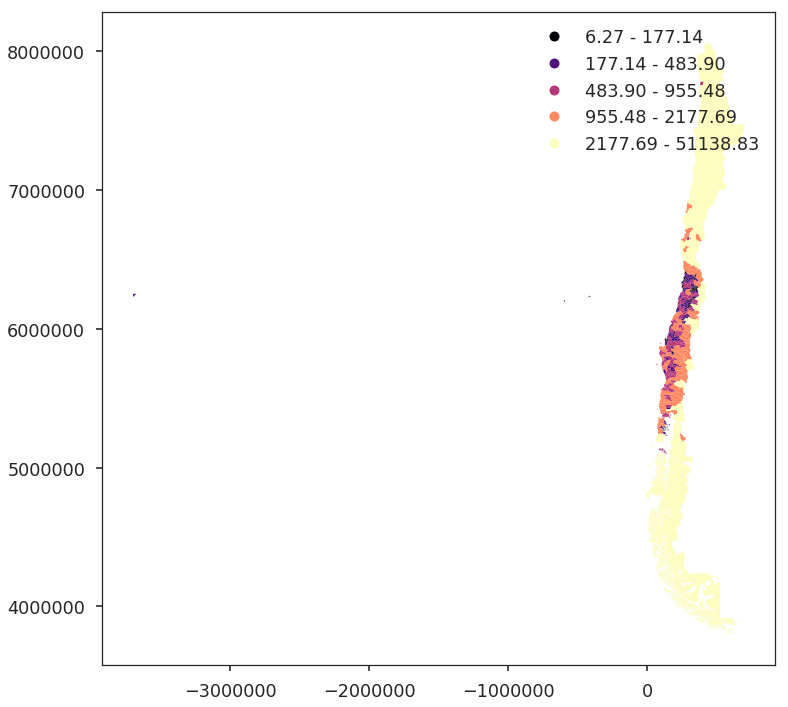

In [4]:
municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

En este notebook analizaremos el área urbana de Santiago. Para eso necesitamos filtrar las comunas que pertenecen a la Región Metropolitana:

In [5]:
metropolitan_region = municipalities[municipalities.NOM_REG == 'Región Metropolitana de Santiago']
metropolitan_region.shape

(52, 11)

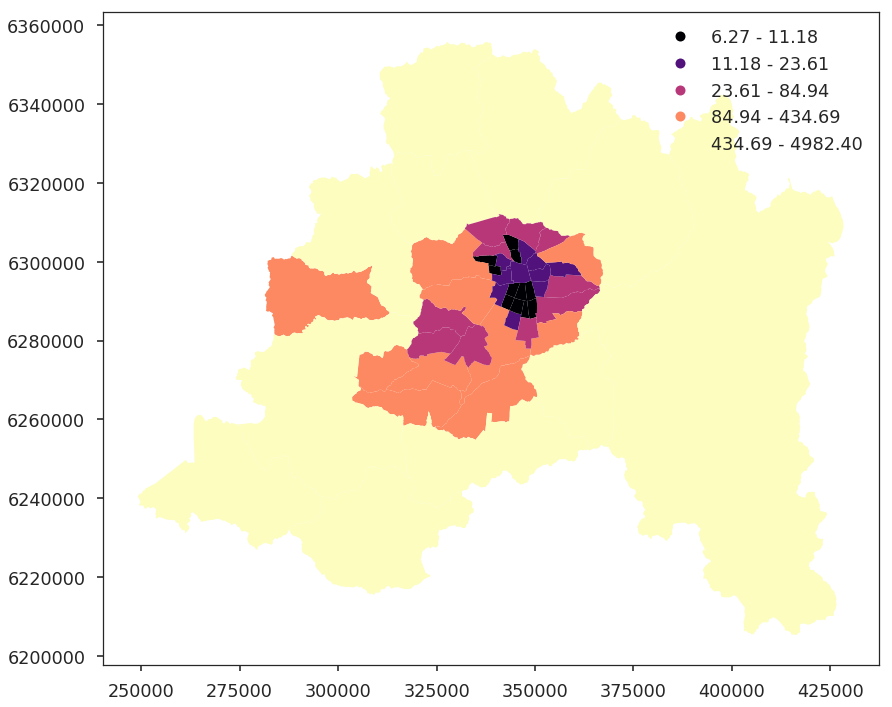

In [6]:
metropolitan_region.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

## Urban Areas

Para poder analizar el área urbana necesitamos otro Shapefile, también disponible en la BCN. Lo cargamos aquí:

In [7]:
urban_areas = gpd.read_file('./input/urban_areas/', crs={'init': 'epsg:5361'})
urban_areas.sample(5)

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
72,Hortensias,Aldea,2218.485040,2.765401e+05,"POLYGON ((226215.1688000001 5684965.7987, 2263..."
274,Hualane,Pueblo,6237.415305,1.381641e+06,"POLYGON ((243147.7906999998 6126510.7286, 2434..."
18,Lota,Ciudad,3891.619134,6.353350e+05,"POLYGON ((131119.6919 5884212.7833, 131125.707..."
363,Santa Cruz,Ciudad,17546.458628,2.647975e+06,"POLYGON ((283650.6880999999 6164279.0651, 2835..."
352,Graneros,Ciudad,12235.465391,3.406482e+06,"POLYGON ((340117.2156999996 6229751.9605, 3403..."


Notamos que tiene una columna `NOMBRE` que seguramente permitirá identificar el área que nos interesa:

In [8]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].shape

(1, 5)

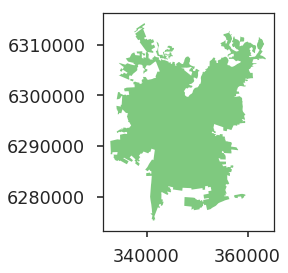

In [9]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].plot()

Guardemos la geometría que nos interesa. Filtraremos el GeoDataframe `urban_areas` buscando el área que se llama `Santiago`. De su columna `geometry` extraeremos sus valores, y de ellos, nos quedaremos con el primero. Esto es necesario porque aunque sabemos que el dataframe solamente contiene una geometría, el método entrega una columna completa, independiente de cuantos elementos tenga ésta.

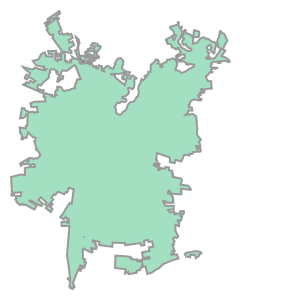

In [10]:
stgo_area = urban_areas[urban_areas.NOMBRE == 'Santiago'].geometry.values[0]
stgo_area

Ahora reasignemos la geometría de las comunas de la región metropolitana para que contengan solamente la intersección con esta área que hemos guardado:

In [11]:
metropolitan_region['geometry'] = metropolitan_region.geometry.map(lambda x: x.intersection(stgo_area))

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


Filtremos las intersecciones que no tienen nada, y que por tanto tienen área cero o nula:

In [12]:
urban_municipalities = metropolitan_region[metropolitan_region.area > 0].copy()
urban_municipalities['area_km2'] = urban_municipalities.area / 1000000

Noten que, debido a que las superficies cambiaron, hemos vuelto a calcular el área. Ahora dibujémosla:

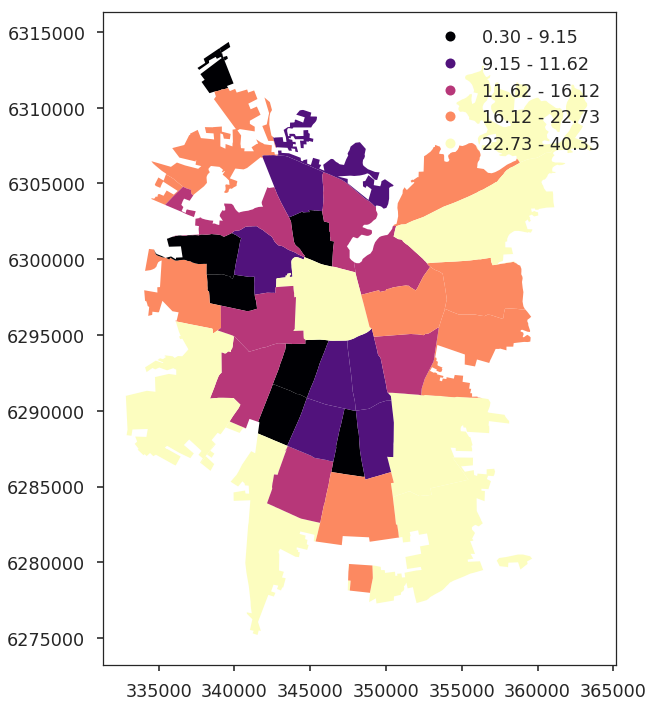

In [13]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

Bien. Ahora convertiremos este GeoDataframe al sistema de coordenadas latitud/longitud, conocido como `EPSG:4326`:

In [14]:
urban_municipalities = urban_municipalities.to_crs({'init': 'epsg:4326'})

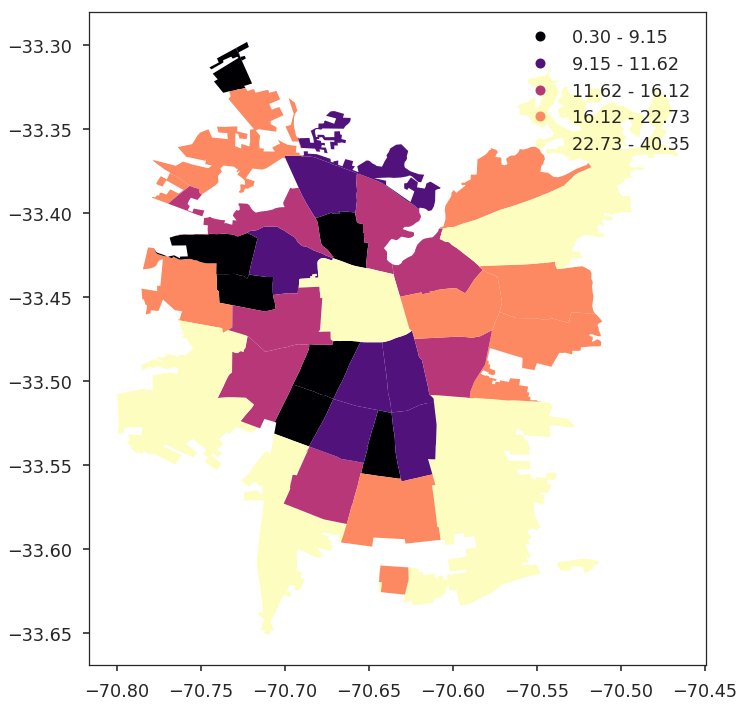

In [15]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

## Coropletas con Contexto

Utilicemos el método `choropleth` de nuestra herramienta `carpynter` (por cierto, está inspirada en el pájaro [carpintero negro](https://es.wikipedia.org/wiki/Campephilus_magellanicus) magallánico :)):

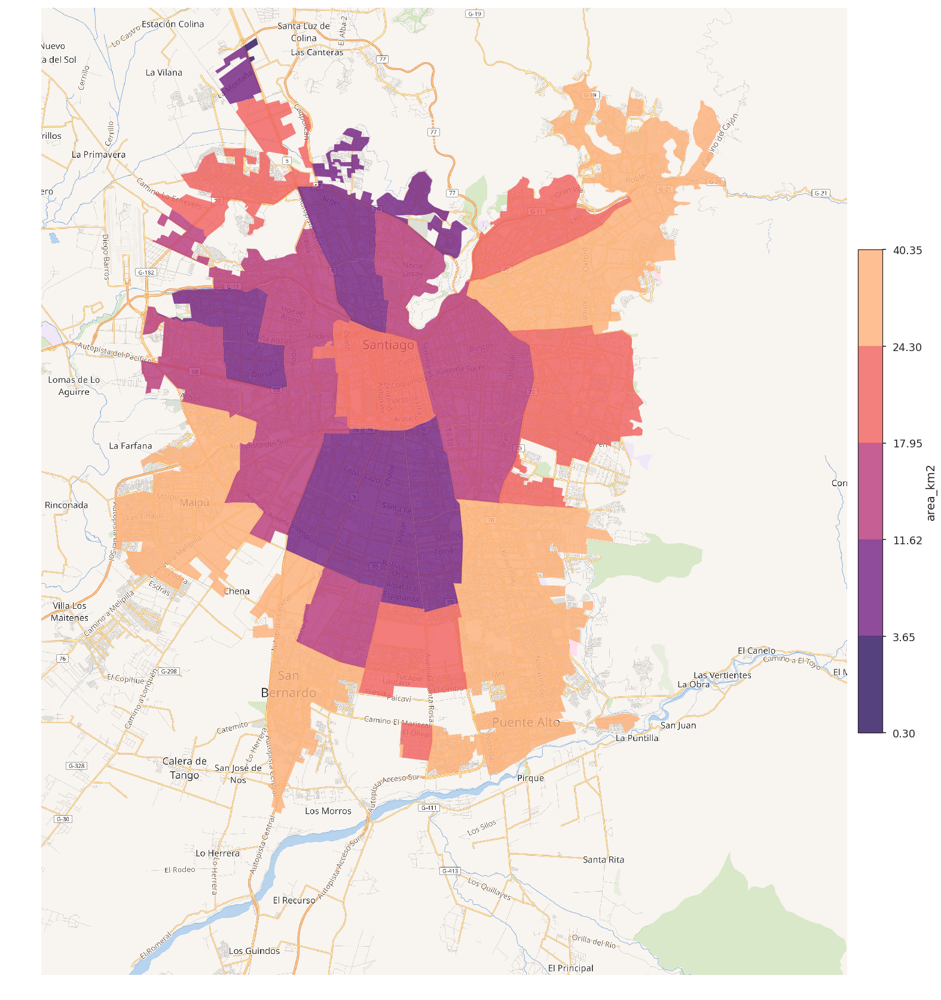

In [16]:
choropleth(urban_municipalities, column='area_km2', scheme='fisher_jenks', palette='magma', figsize=28, alpha=0.8)

Al mostrar el contexto del mapa podemos darnos cuenta que los datos de áreas urbanas de la BCN están desactualizados con respecto a los bordes urbanos de la ciudad.

También podemos mostrar datos categóricos. Utilizando la paleta de colores HUSL, en el que asignaremos un color distinto a cada comuna:

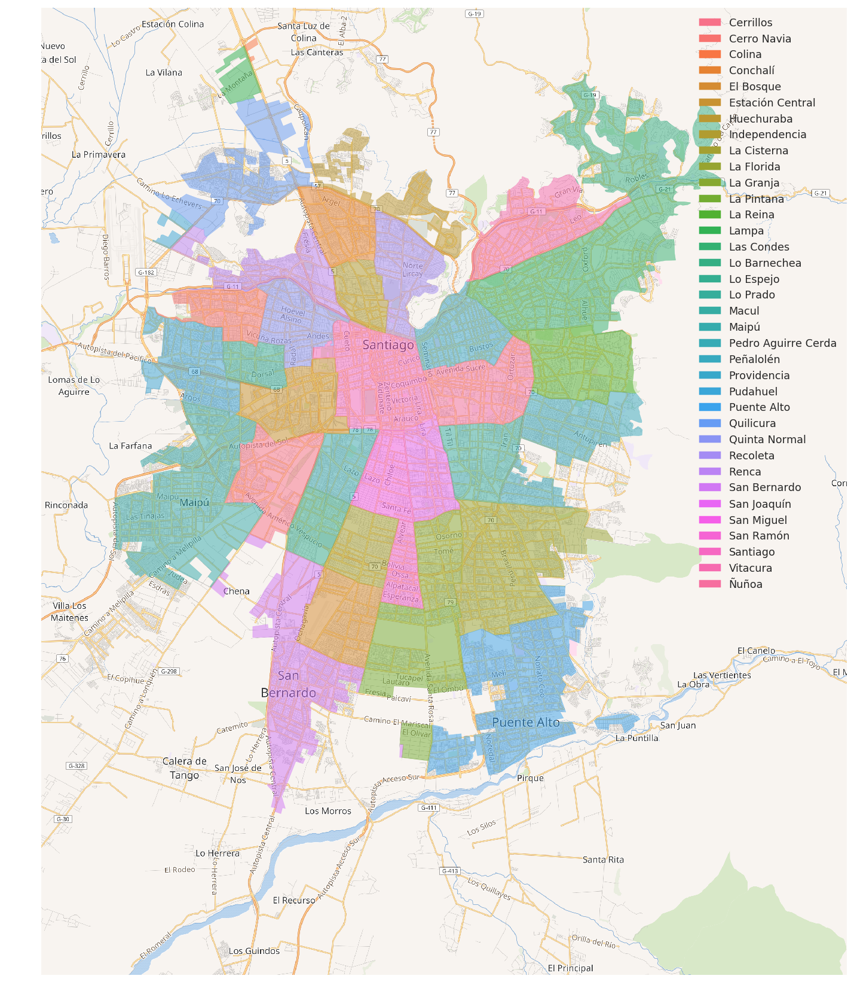

In [17]:
choropleth(urban_municipalities, column='NOM_COM', scheme='categorical', palette='husl', figsize=28, alpha=0.5)

Como son tantas comunas es prácticamente imposible tener colores que se _perciban_ distintos entre cada una. Pero ese es un problema que atacaremos más adelante en el taller.

## Encuesta CASEN 2013: Satisfacción con la Vida e Ingreso

Carguemos y analicemos la Encuesta CASEN, en su versión 2013 (descargable [aquí](http://www.ministeriodesarrollosocial.gob.cl/basededatoscasen.php)). Esta encuesta se realizada cada dos años, y [Wikipedia la describe de la siguiente manera](https://es.wikipedia.org/wiki/Encuesta_Casen):

> Esta encuesta es mandatada por el Ministerio de Desarrollo Social de Chile ex Ministerio de Planificación y Cooperación (Mideplan) y se caracteriza por medir las condiciones socioeconómicas de los hogares del país, en términos de acceso a la salud, la educación, el trabajo y a las condiciones de la vivienda. Proporciona datos como la situación de pobreza e indigencia de la población y como está distribuido el ingreso. También entrega antecedentes sobre la cobertura y perfil de los beneficiarios de los programas sociales. Permite orientar el diseño para nuevos proyectos y de modificaciones en los sistemas de retribución de los beneficios para mejorar la focalización de aquellos que funcionan como carácter selectivo.

> La encuesta Casen además es ampliamente utilizada por otros Ministerios y servicios públicos para el diseño y evaluación de sus políticas y programas. Además diversas universidades, centros académicos y otras entidades son usuarios de la información proporcionada por la encuesta.

> La información que proporciona la encuesta, constituye un antecedente básico para focalizar el gasto social y sirve de manera sustantiva al proceso de descentralización de la gestión del Estado, permite obtener resultados a nivel regional y para un número muy significativo de las comunas del país.

Nos enfocamos en la versión 2013 porque incluye una pregunta que nos interesa analizar: **Considerando todas las cosas, ¿Qué tan satisfecho(a) estás con tu vida?**

La respuesta a esa pregunta está codificada en una escala de 1 (totalmente insatisfecho(a)) a 10 (totalmente satisfecho(a)).

Comencemos :)

In [18]:
casen = pd.read_csv('./input/2013_casen_survey/Casen2013.csv.gz', sep=',', encoding='iso-8859-1')
casen.sample(3)

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (16,18,25,27,38,51,114,234,286,312,316,332,349,360,369) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,folio,o,region,comuna,zona,pco1,sexo,edad,ecivil,...,esc,educ,depen,activ,indmat,indsan,calgobviv,iai,iae,hacinamiento
50150,50150,5.605100e+10,1,5,5605,1,1,1,59,1,...,6.0,1,NaN,2.0,2,1,2,2,1,1
74315,74315,7.101103e+10,4,7,7101,1,8,2,22,2,...,12.0,5,NaN,1.0,1,1,1,2,1,1
133023,133023,9.201104e+10,1,9,9201,1,1,1,64,6,...,3.0,1,NaN,3.0,1,1,1,1,1,1


In [19]:
list(casen.columns)

['Unnamed: 0',
 'folio',
 'o',
 'region',
 'comuna',
 'zona',
 'pco1',
 'sexo',
 'edad',
 'ecivil',
 'h5l',
 'h5h',
 'pareja',
 'nucleo',
 'pco2',
 'h8',
 'h8esp',
 'h9',
 'h9esp',
 'e1',
 'e2a',
 'e2b',
 'e2c',
 'e3',
 'e4',
 'e4esp',
 'e5',
 'e5esp',
 'e6a',
 'e6b',
 'e6c',
 'e6d',
 'e7',
 'e8nom',
 'e8dir',
 'e8com',
 'e8com_cod',
 'e8rbd',
 'e8dv',
 'e8depen',
 'e8te',
 'e9',
 'e10',
 'e11a',
 'e11b',
 'e11c',
 'e11d',
 'e11e',
 'e12a',
 'e12b1',
 'e12b2',
 'e12esp',
 'e13pbu',
 'e13pbt',
 'e13pbd',
 'e13pbm',
 'e13bu',
 'e13bt',
 'e13bd',
 'e13bm',
 'e13bpc',
 'e13mu',
 'e13mt',
 'e13md',
 'e13mm',
 'e14a',
 'e14b',
 'e15',
 'e16',
 'e17t1',
 'e18m1',
 'e18p1',
 'e17t2',
 'e18m2',
 'e18p2',
 'e0',
 'o1',
 'o2',
 'o3',
 'o4',
 'o5',
 'o6',
 'o7r1',
 'o7r2',
 'o8',
 'o9a',
 'oficio4',
 'oficio1',
 'o9b',
 'o10',
 'o11',
 'o12',
 'o13',
 'o14',
 'o15',
 'o16',
 'o17',
 'o18',
 'o19',
 'o20',
 'o21',
 'rama4_sub',
 'rama1_sub',
 'o22',
 'o23',
 'rama4',
 'rama1',
 'o24',
 'o25',
 'o26

Wow, es una encuesta enorme. ¡Tiene muchísima información! Sin embargo, gran parte de las preguntas tiene un identificador que no conocemos. Lo mismo para las preguntas que nos interesan.

### Decodificación y Filtrado

Para asignar observaciones a las comunas y filtrar aquellas que nos interesan debemos conocer los códigos asignados a cada una.

Al acceder al [Libro de Códigos](http://observatorio.ministeriodesarrollosocial.gob.cl/documentos/Libro_de_Codigos_Casen_2013_Base_Principal_Metodologia_Nueva.pdf) de la encuesta encontramos el código asociado a cada variable categórica. 

Construyamos un diccionario con los identificadores de las comunas, ya que analizaremos la satisfacción en el área urbana de Santiago:

In [20]:
name_map = dict(zip([13101, 13102, 13103
    ,13104,13105,13106,13107,13108,13109,13110,13111,13112,13113,13114,13115,13116,13117,13118,13119,13120,13121,13122,13123
    ,13124,13125,13126,13127,13128,13129,13130,13131,13132,13201,13202,13203,13301,13302,13303,13401,13402,13403,13404,13501,
    13502, 13503, 13504, 13505, 13601, 13602, 13603, 13604, 13605],
    map(lambda x: x.title(), ['Santiago', 'Cerrillos', 'Cerro Navia', 'Conchalí', 'El Bosque', 'Estación Central', 'Huechuraba', 'Independencia', 'La Cisterna', 'La Florida', 'La Granja', 'La Pintana', 'La Reina', 'Las Condes', 'Lo Barnechea', 
                          'Lo Espejo', 'Lo Prado', 'Macul', 'Maipú', 'Ñuñoa', 'Pedro Aguirre Cerda', 'Peñalolén', 'Providencia', 
                          'Pudahuel', 'Quilicura', 'Quinta Normal', 'Recoleta', 'Renca', 'San Joaquín', 'San Miguel',
                          'San Ramón', 'Vitacura', 'Puente Alto', 'Pirque', 'San José de Maipo', 'Colina',
                          'Lampa', 'Tiltil', 'San Bernardo', 'Buin', 'Calera de Tango', 'Paine',
                          'Melipilla', 'Alhué', 'Curacaví', 'María Pinto', 'San Pedro', 'Talagante',
                          'El Monte', 'Isla de Maipo', 'Padre Hurtado', 'Peñaflor'
])))
name_map

{13101: 'Santiago',
 13102: 'Cerrillos',
 13103: 'Cerro Navia',
 13104: 'Conchalí',
 13105: 'El Bosque',
 13106: 'Estación Central',
 13107: 'Huechuraba',
 13108: 'Independencia',
 13109: 'La Cisterna',
 13110: 'La Florida',
 13111: 'La Granja',
 13112: 'La Pintana',
 13113: 'La Reina',
 13114: 'Las Condes',
 13115: 'Lo Barnechea',
 13116: 'Lo Espejo',
 13117: 'Lo Prado',
 13118: 'Macul',
 13119: 'Maipú',
 13120: 'Ñuñoa',
 13121: 'Pedro Aguirre Cerda',
 13122: 'Peñalolén',
 13123: 'Providencia',
 13124: 'Pudahuel',
 13125: 'Quilicura',
 13126: 'Quinta Normal',
 13127: 'Recoleta',
 13128: 'Renca',
 13129: 'San Joaquín',
 13130: 'San Miguel',
 13131: 'San Ramón',
 13132: 'Vitacura',
 13201: 'Puente Alto',
 13202: 'Pirque',
 13203: 'San José De Maipo',
 13301: 'Colina',
 13302: 'Lampa',
 13303: 'Tiltil',
 13401: 'San Bernardo',
 13402: 'Buin',
 13403: 'Calera De Tango',
 13404: 'Paine',
 13501: 'Melipilla',
 13502: 'Alhué',
 13503: 'Curacaví',
 13504: 'María Pinto',
 13505: 'San Pedro',
 

In [21]:
# solamente RM
casen = casen[casen.region == 13].copy()
casen.shape

(36680, 601)

Acabamos de filtrar las observaciones para la RM, y ahora crearemos una columna con los nombres de comuna que nos interesan:

In [22]:
casen['municipality'] = casen['comuna'].map(lambda x: name_map[x])
casen['municipality'].value_counts()

Maipú                  2968
Puente Alto            2882
La Florida             1729
San Bernardo           1476
Peñalolén              1398
Pudahuel               1251
Las Condes             1163
La Pintana             1105
Santiago                961
Quilicura               945
Cerro Navia             900
Recoleta                894
El Bosque               885
La Granja               878
Providencia             850
Renca                   816
Conchalí                794
Ñuñoa                   785
Estación Central        772
Macul                   675
Lo Prado                642
Pedro Aguirre Cerda     640
Quinta Normal           603
Melipilla               555
San Ramón               543
Talagante               504
Peñaflor                486
Lo Espejo               485
Vitacura                485
San Joaquín             476
Lo Barnechea            469
Lampa                   454
Huechuraba              449
Cerrillos               448
Independencia           439
La Cisterna         

Por otro lado, al ver el libro de códigos observamos que la pregunta `r20` va de 1 a 10, pero que puede tener valor 99 cuando no se responde. Veamos:

In [23]:
casen['r20'].describe()

count    14467.000000
mean         8.382526
std          9.278511
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         99.000000
Name: r20, dtype: float64

El problema de que el valor sea 99 es que no es un valor nulo, por lo que distorsiona los resultados. Entonces, tendremos que filtrar las observaciones de la encuesta, dejando las que pertenezcan a las comunas urbanas, que tengan una respuesta válida, y adicionalmente, que sean respondidas por adultos:

In [24]:
casen = casen[(casen.municipality.isin(urban_municipalities['NOM_COM'])) 
              & (casen.r20 <= 10)
              & (casen.edad >= 18)].copy()
casen.shape

(12197, 602)

¿Cómo quedó el factor?

In [25]:
casen['r20'].describe()

count    12197.000000
mean         7.468804
std          2.180284
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         10.000000
Name: r20, dtype: float64

Mucho mejor. Vemos que la satisfacción promedio es prácticamente 7.5, y que la media es 8. Aparentemente vivimos en una ciudad muy satisfecha con su vida, ya que la escala es de 1 a 10.

El siguiente gráfico muestra la distribución de la variable:

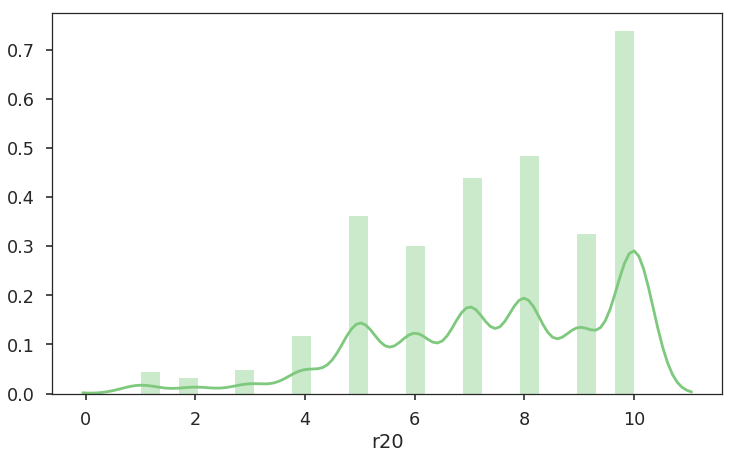

In [26]:
plt.figure(figsize=(12,7))
sns.distplot(casen.r20)

Wow, parece que la gente en Chile está muy satisfecha con su vida :) Noten como la distribución tiene a valores cercanos a 10, y sobretodo mayores a 5.

Veamos como se distribuye esta variable en cada municipalidad, utilizando el método `FacetGrid` de seaborn que vimos en el ejercicio anterior:

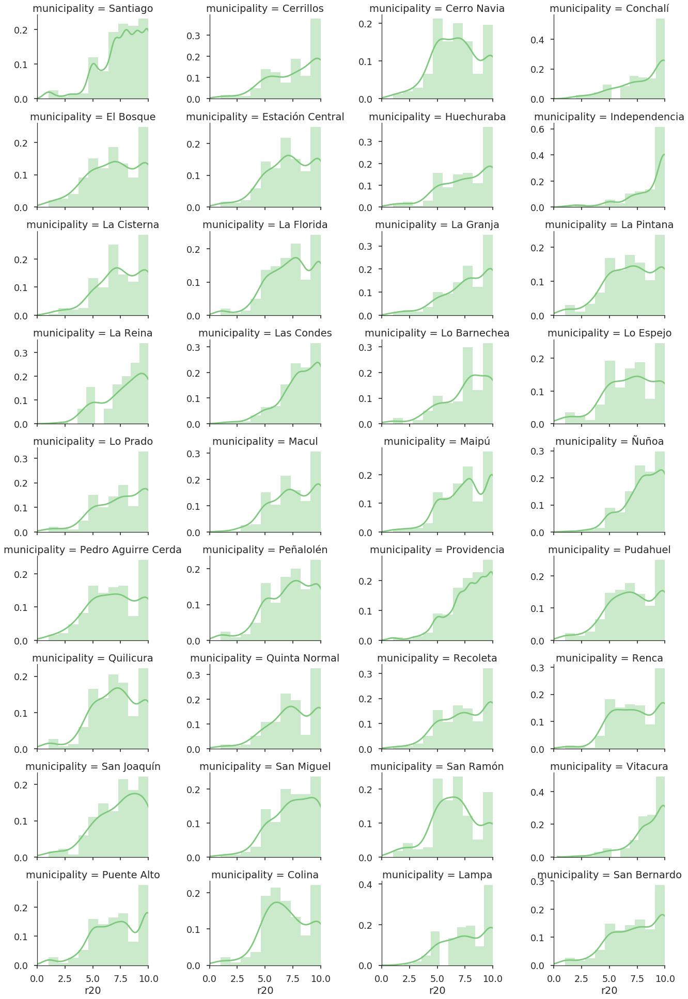

In [27]:
g = sns.FacetGrid(data=casen, col='municipality', col_wrap=4, aspect=1.5, size=3, sharey=False)
g.map(sns.distplot, 'r20', bins=10)
g.set(xlim=[0,10])
g.add_legend()

¡Son gráficos muy bonitos! Y podemos encontrar historias. ¿Cuáles son las formas características de las comunas?¿Cuáles son las comunas mayoritariamente (in)felices?

### Expandiendo la Muestra: Datos a Nivel Comunal

Podríamos responder esas preguntas mirando los gráficos, pero no estaríamos haciendo lo correcto, porque no sabemos qué tan representativa es cada observación. Esta representatividad está representada en los [factores de expansión](http://www.redatam.org/redchl/mds/casen/WebHelp/informaci_n_casen/factores_de_expancion.htm), que son estimados por las instituciones encuestadoras a partir del diseño muestral. En el caso de la Encuesta CASEN, existe un [documento de metodología que detalla todo este cálculo](http://observatorio.ministeriodesarrollosocial.gob.cl/documentos/Metodologia_Diseno_Muestral_Casen_2013.pdf).

Al explorar las columnas que tiene la base de datos nos damos cuenta que hay tres factores de expansión: `expc`, `expr` y `expr_r20`. De acuerdo al documento de metodología, los dos primeros son los que se utilizar para expandir las muestras a nivel comunas y regional. Aunque no lo menciona, se deriva que el factor `expr_r20` es exclusivamente para la pregunta `r20`, aunque solamente estimado a nivel regional.


In [28]:
casen.loc[:,('r20', 'expr_r20', 'expr', 'expc')].sample(5)

,r20,expr_r20,expr,expc
174217,10.0,338.0,187,160
167164,10.0,2267.0,361,256
174822,7.0,442.0,89,53
178169,8.0,338.0,187,108
177338,9.0,457.0,284,502


Observamos que los factores `expr` y `expc` no son iguales. Esto es esperable: las distribuciones comunales no son iguales a las regionales. También vemos que el factor `expr_r20` a veces puede ser nulo.

**Aquí debemos tomar una decisión**. Aunque el documento de metodología no recomienda utilizar el factor de expansión comunal, debido a que la representatividad de la encuesta es a nivel regional, elegiremos utilizar el factor comunal, con el fin de ser coherentes en las dos variables que analizaremos.

### Satisfacción con la vida a nivel comunal

Haremos lo siguiente: queremos el promedio de satisfacción por comuna. Por tanto, primero expandiremos el valor reportado en `r20`:

In [29]:
casen['adjusted_r20'] = casen['r20'] * casen['expc']

Luego sumaremos el total de población considerada en cada municipalidad:

In [30]:
casen_municipality_exp = casen.groupby('municipality').aggregate({'expc': 'sum'})
casen_municipality_exp.head()

,expc
municipality,
Cerrillos,24293
Cerro Navia,47677
Colina,32176
Conchalí,35481
El Bosque,59315


Después calcularemos la suma total de satisfacción ajustada, que dividiremos por el total de población. El resultado será almacenado en la columna `exp_average`:

In [31]:
satisfaction = casen.groupby('municipality').aggregate({'adjusted_r20': 'sum'}).join(casen_municipality_exp)
satisfaction['exp_average'] = satisfaction['adjusted_r20'] / satisfaction['expc']
satisfaction.head()

,adjusted_r20,expc,exp_average
municipality,,,
Cerrillos,190651.0,24293,7.847981
Cerro Navia,326167.0,47677,6.841181
Colina,243099.0,32176,7.555290
Conchalí,285127.0,35481,8.036047
El Bosque,420962.0,59315,7.097058


In [32]:
#satisfaction

Agreguemos una columna llamada `life_satisfaction` a nuestro GeoDataframe de municipalidades, que contenga el valor calculado por cada municipalidad:

In [33]:
urban_municipalities = urban_municipalities.join(satisfaction['exp_average'], on='NOM_COM')

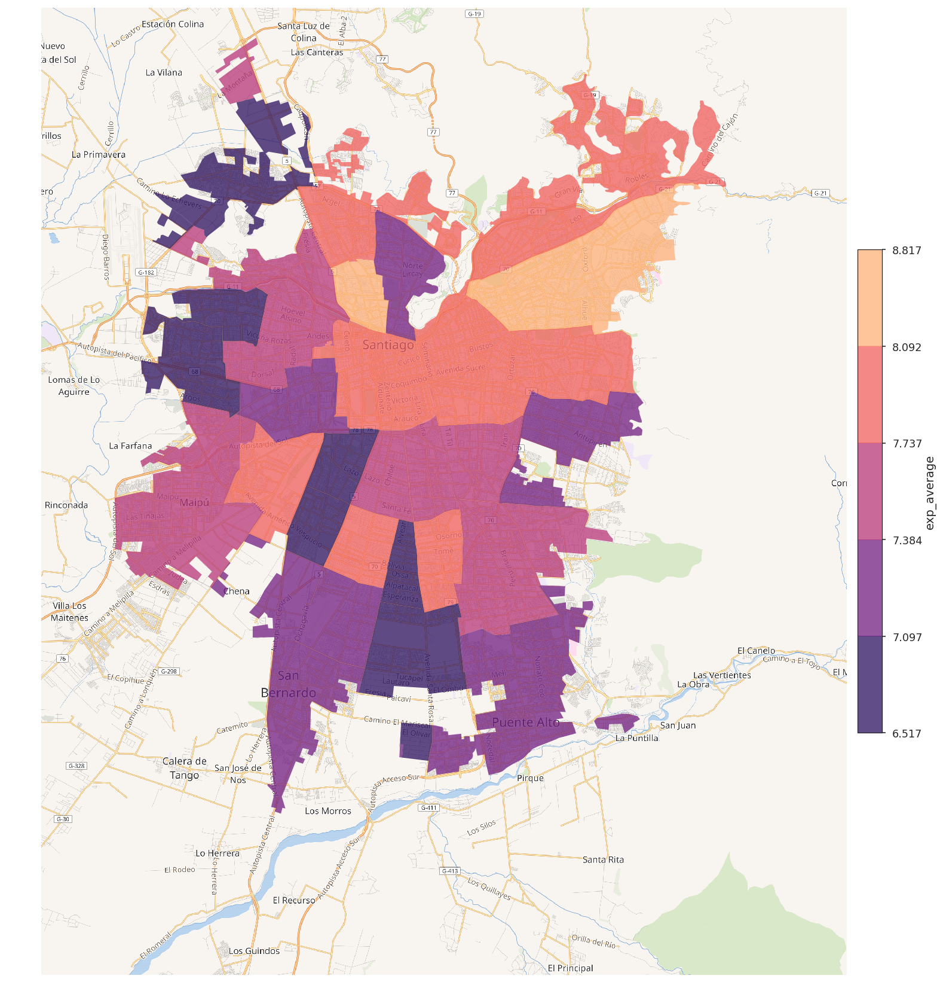

In [34]:
choropleth(urban_municipalities, figsize=28, column='exp_average', palette='magma', n_colors=5)

¡Que lindo mapa! 

Ahora bien, **algo no cuadra**: los promedios son "altos": el valor mínimo encontrado es $6.5$. De hecho, gracias a eso se dice que gran parte de los chilenos [está satisfecho con su vida](http://www.plataformaurbana.cl/archive/2015/02/28/encuesta-casen-en-dos-anos-suben-de-63-a-70-los-chilenos-que-estan-felices-con-su-vida/). Sin embargo, Chile también es un país con [preocupantes índices de depresión](http://www.elmostrador.cl/agenda-pais/vida-en-linea/2017/02/23/chile-se-ubica-por-sobre-el-promedio-mundial-en-indice-de-depresion-segun-nuevo-informe-de-la-oms/) y de [estrés](https://www.publimetro.cl/cl/nacional/2016/10/27/80-chilenos-viven-alto-nivel-estres.html). Entonces, ¿cómo interpretar estos números?

Proponemos que la manera correcta de hacerlo es ver los índices de satisfacción de manera relativa. Lo que importa no es si alguien dice 7 de 10, sino qué tan arriba o abajo del promedio alguien dice estar satisfecho. 

Para poder calcular estos valores relativos utilizaremos la fórmula de [puntaje estándar](https://es.wikipedia.org/wiki/Unidad_tipificada) o $z-score$:

$$z = \frac{x - \mu}{\sigma}$$ 

El puntaje estándar nos dice qué tanto se aleja un valor del promedio, en términos de la desviación estándar del dataset. Lo podemos calcular así:

In [35]:
urban_municipalities['z_satisfaction'] = ((urban_municipalities['exp_average'] - urban_municipalities['exp_average'].mean()) /
                                        urban_municipalities['exp_average'].std())
urban_municipalities['z_satisfaction'].sample(5)

291    0.694212
296   -0.460267
181    0.065611
304   -0.034553
293    1.117739
Name: z_satisfaction, dtype: float64

Veamos como queda la distribución de los valores:

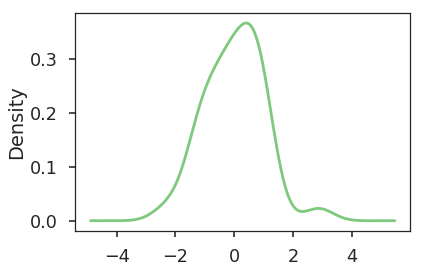

In [36]:
urban_municipalities['z_satisfaction'].plot(kind='density')

Como resultado, observamos que tenemos personas con valores negativos (bajo el promedio) y positivos (sobre el promedio). 

En la visualización podemos usar una escala de colores que permite _ver_ mejor esas diferencias:

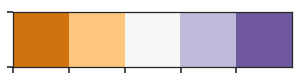

In [37]:
sns.palplot(sns.color_palette('PuOr', n_colors=5))

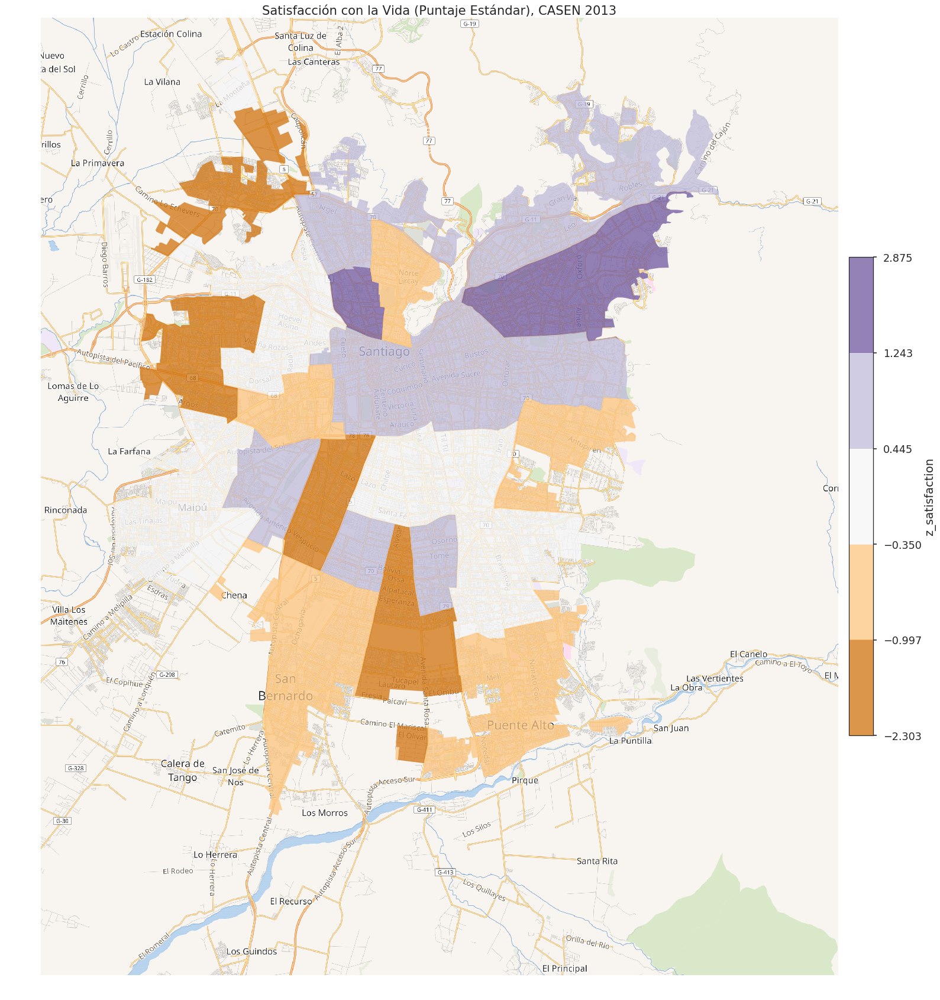

In [38]:
choropleth(urban_municipalities, figsize=28,  column='z_satisfaction', palette='PuOr', n_colors=5)
plt.title('Satisfacción con la Vida (Puntaje Estándar), CASEN 2013')

¿Encuentran algo inesperado en este mapa? Quienes sean de Santiago reconocerán que el mapa refleja parte de la segregación económica de la ciudad, pero sorprendemente **aparecen comunas satisfechas a pesar de no tener altos ingresos**. Independencia es una de ellas. ¿Por qué? Descubrir eso es un proyecto interesante y queda propuesto para les estudiantes como proyecto para el semestre.

#### Hablemos de Colores

Este tipo de escalas, llamadas _divergentes_, nos muestran ambos extremos de un continuo. El color blanco representa las observaciones que son cercanas al promedio, mientras que el color púrpura se asigna a las observaciones sobre él. La intensidad del color indica qué tan lejos llega. Del mismo modo, el color naranjo se utiliza para las observaciones bajo el promedio. Esto permite ver el contraste en los niveles de satisfacción de manera clara.

Existen distintos tipos de paletas divergentes que veremos más adelante en una clase de visualización y uso de color. 

## Ingreso de Hogares

Sigamos analizando: al ver los mapas parece existir una correlación clara con el nivel de ingreso (variable `ytotcorh`). Exploremos esta variable en la CASEN:

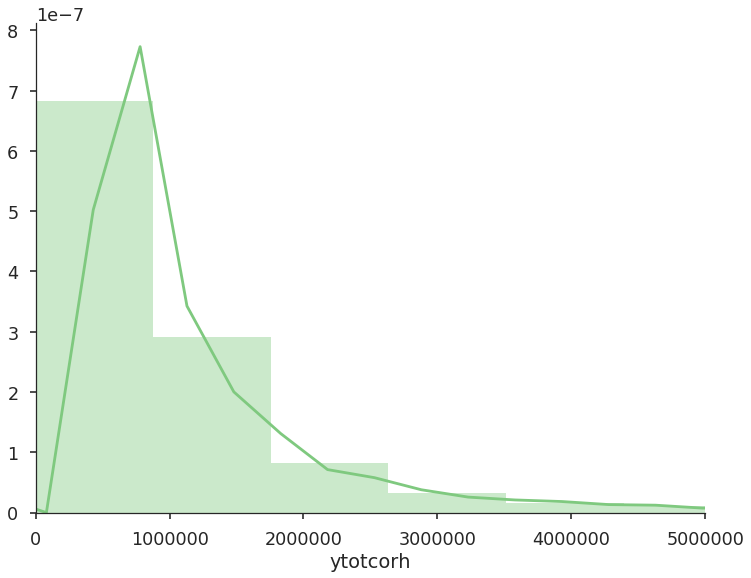

In [39]:
plt.figure(figsize=(12,9))
sns.distplot(casen['ytotcorh'])
# cortamos en 5 millones de pesos
plt.xlim([0, 5000000])
sns.despine()

In [40]:
casen['ytotcorh'].describe()

count    1.219700e+04
mean     1.105801e+06
std      1.354931e+06
min      0.000000e+00
25%      4.614330e+05
50%      7.312500e+05
75%      1.213333e+06
max      4.390000e+07
Name: ytotcorh, dtype: float64

La media de observaciones es aprox. 735000 pesos. Esto quiere decir que la mitad de la gente entrevistada en la encuesta gana menos de eso.

Veamos la distribución por comunas:

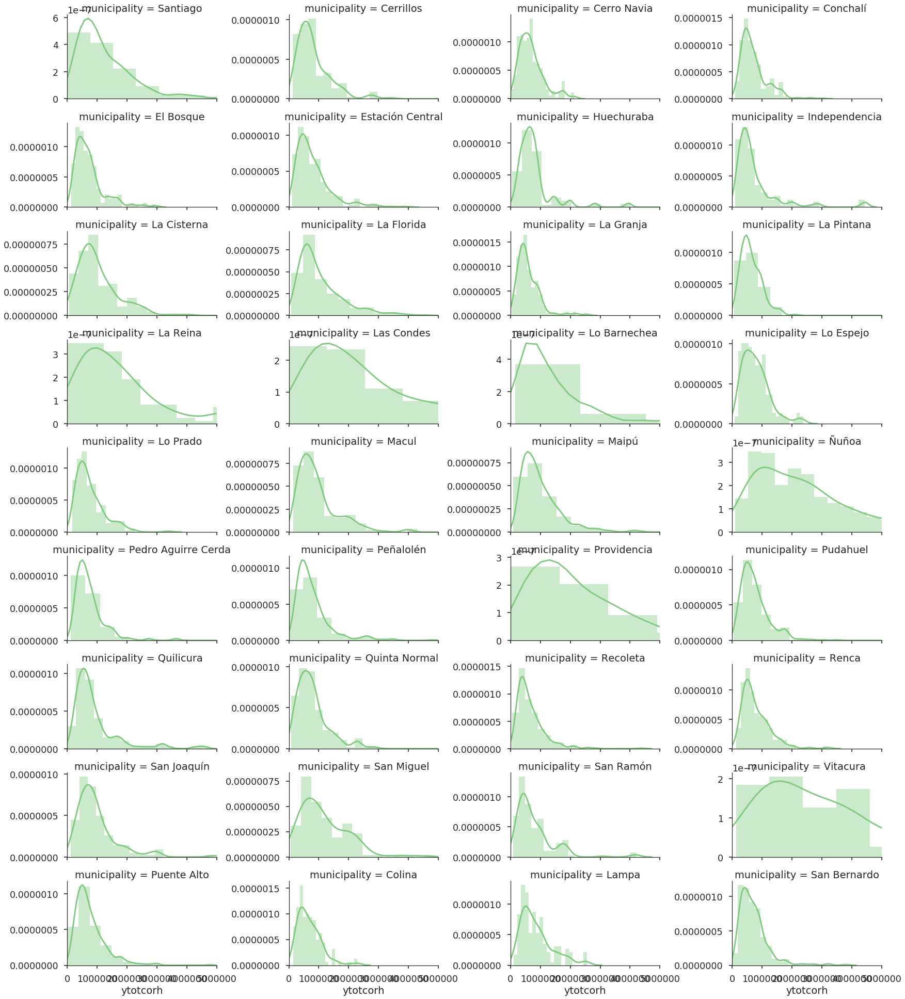

In [41]:
g = sns.FacetGrid(data=casen, col='municipality', col_wrap=4, aspect=2, size=3, sharey=False)
g.map(sns.distplot, 'ytotcorh', bins=20)
g.set(xlim=[0,5000000])

No hay grandes sorpresas en este gráfico.

Aunque no debemos olvidar que necesitamos hacer el mismo cálculo de expansión que hicimos para la satisfacción, de modo de poder construir un mapa de coropletas:

In [42]:
casen['adjusted_income'] = casen['ytotcorh'] * casen['expc']
casen_municipality_income_exp = casen.groupby('municipality').aggregate({'expc': 'sum'})
income = casen.groupby('municipality').aggregate({'ytotcorh': 'sum', 'adjusted_income': 'sum'}).join(casen_municipality_income_exp)
income.head()

,ytotcorh,adjusted_income,expc
municipality,,,
Cerrillos,147957764,20908655648,24293
Cerro Navia,228692320,32332260017,47677
Colina,102461713,25505848171,32176
Conchalí,208278030,24606575864,35481
El Bosque,219680291,46275526490,59315


In [43]:
income['exp_income'] = income['adjusted_income'] / income['expc']

In [44]:
income.sort_values(by='exp_income')

,ytotcorh,adjusted_income,expc,exp_income
municipality,,,,
Recoleta,230003060,29004721722,46804,6.197060e+05
La Granja,196694788,28159171597,44796,6.286091e+05
Independencia,121557039,10629522662,16862,6.303833e+05
La Pintana,261661249,49298638528,74019,6.660268e+05
Cerro Navia,228692320,32332260017,47677,6.781521e+05
Pudahuel,343362031,69222082930,100295,6.901848e+05
San Bernardo,463364406,97106815085,140686,6.902379e+05
Conchalí,208278030,24606575864,35481,6.935142e+05
San Ramón,151050915,21186208369,28307,7.484441e+05


In [45]:
urban_municipalities = urban_municipalities.join(income['exp_income'], on='NOM_COM')

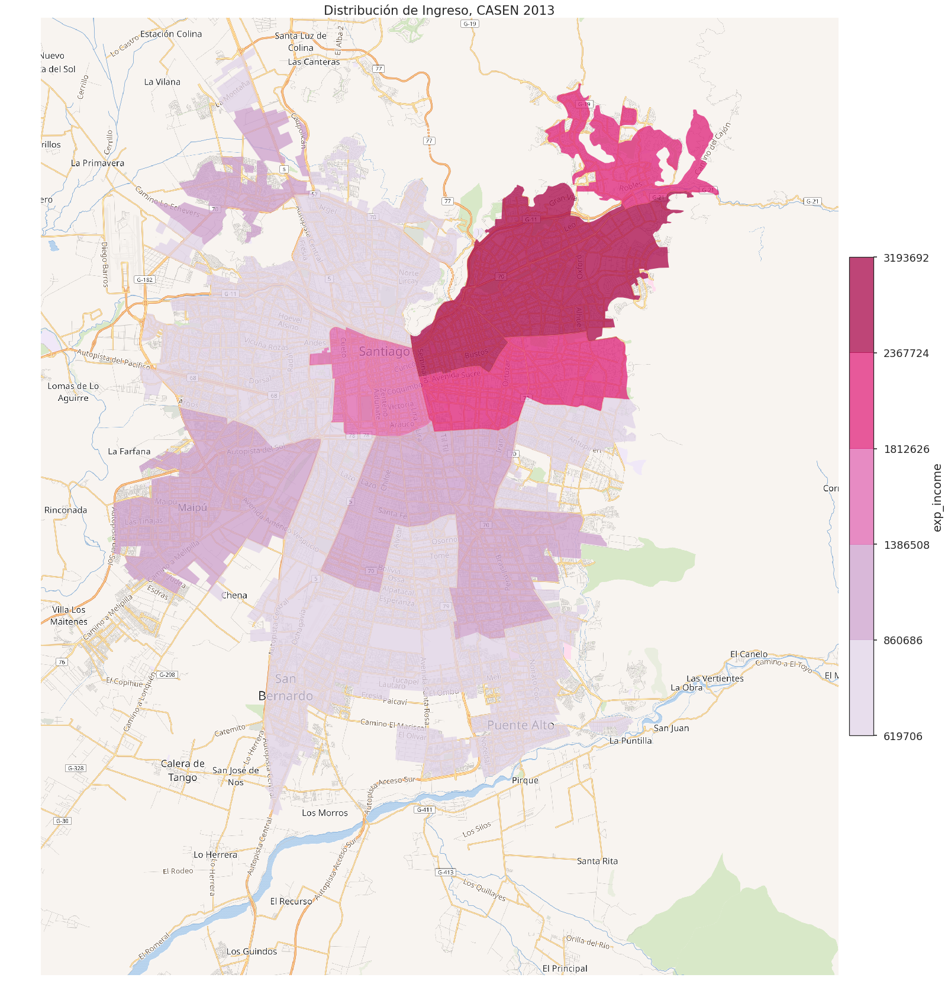

In [46]:
choropleth(urban_municipalities, figsize=28, column='exp_income', scheme='fisher_jenks', palette='PuRd', n_colors=5)
plt.title('Distribución de Ingreso, CASEN 2013')

El mapa nos entrega resultados que se asemejan al mapa de ejemplo que vimos al inicio de este notebook.

Una pregunta que uno/a podría hacerse es: **¿por qué no estimar el puntaje estándar del ingreso?** Hay dos razones que justifican esta (no) decisión. Primero, la distribución de ingreso es tan sesgada que el promedio y la desviación estándar no son representativas del dataset. Segundo, a diferencia de la variable de satisfacción, el ingreso tiene una unidad (pesos), que tiene una interpretación específica y que todes entendemos.

## Correlación entre Ingreso y Satisfacción con la Vida a nivel comunal

Los mapas parecen confirmar que existe una correlación entre ingreso y satisfacción con la vida. Que dos variables estén correlacionadas significa que un cambio en una conlleva un cambio en la otra. Una correlación positiva significa que si una aumenta, la otra también; una correlación negativa lo contrario: si una aumenta, la otra disminuye. No obstante, [no hay que confundir correlación con causalidad](http://naukas.com/2012/08/01/correlacion-no-implica-causalidad/). Usualmente son otros factores, latentes o escondidos, los que causan dichos cambios. Eso no significa que la correlación no sea útil, porque saber que dos variables están correlacionadas permite realizar predicciones. 

Existen muchas maneras de medir correlación. Hoy veremos tres: Pearson, Spearman, y Autocorrelación espacial. En los tres casos el valor de la correlación pertenece al rango $[-1, 1]$, donde:

  * $1$ significa correlación absoluta positiva.
  * $0$ significa que no hay correlación alguna.
  * $-1$ significa que la correlación es negativa.
  
### Correlación de Pearson

Podemos formalizar este análisis utilizando el método `jointplot` de `seaborn`, que visualiza una posible correlación utilizando el [coeficiente de Pearson](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient):

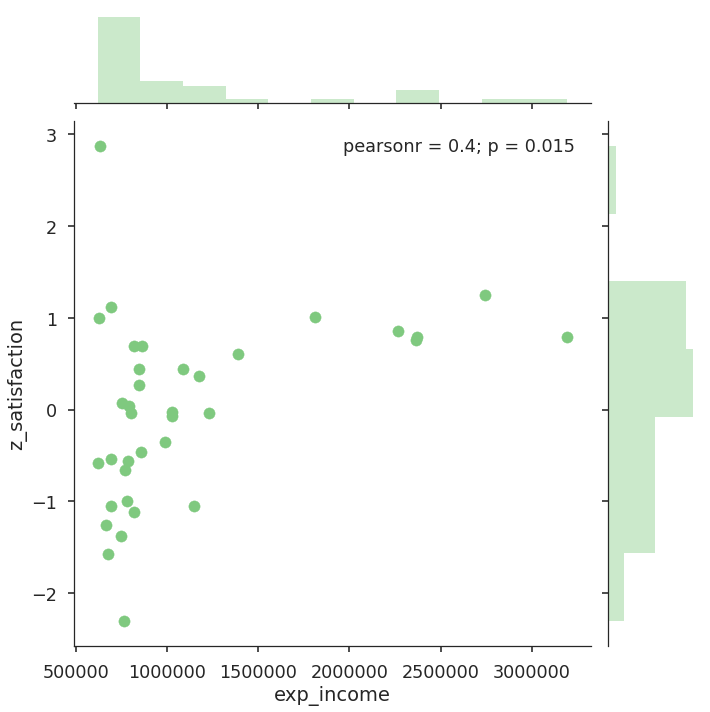

In [47]:
sns.jointplot('exp_income', 'z_satisfaction', urban_municipalities, size=10)

Efectivamente hay una correlación media y significativa ($\rho = 0.4$). Sin embargo, vemos que la distribución de ingreso está sesgada a la izquierda (es decir, a ingresos más bajos). La correlación de Pearson asume variables con distribuciones normales.

Una alternativa es transformar la variable de ingreso utilizando escala logarítmica. Esto permite comparar los órdenes de magnitud de ingreso en vez del ingreso mismo. Lo podemos hacer así:

In [48]:
urban_municipalities['log_income'] = np.log(urban_municipalities['exp_income'])

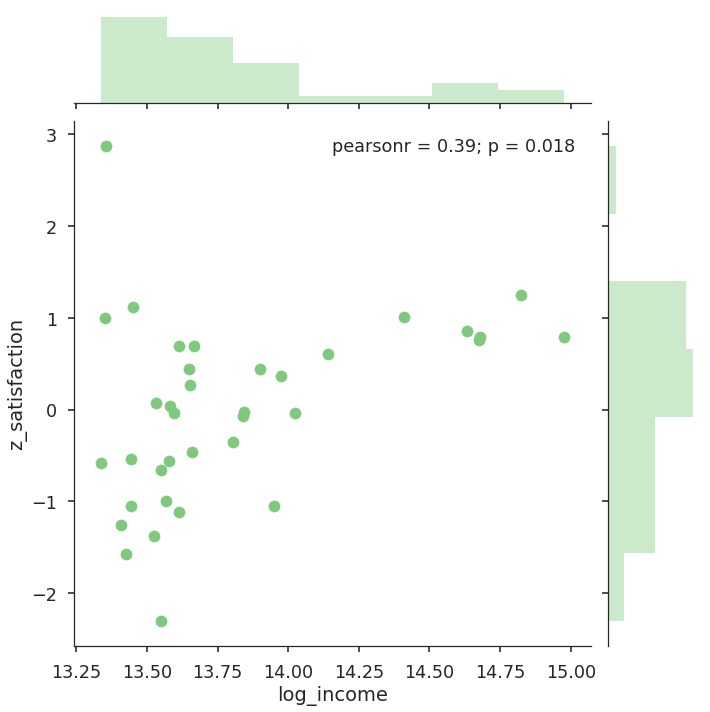

In [49]:
sns.jointplot('log_income', 'z_satisfaction', urban_municipalities, size=10)

La distribución está mejor, pero sigue sin respetar el requisito de normalidad (¿será una muestra de lo enormemente desigual que es nuestro país?). Sin embargo, la correlación se mantiene en una magnitud similar ($\rho = 0.39$), que todavía es relevante.

### Correlación de Spearman

Otra alternativa es usar otra función de correlación. La alternativa más usada a la de Pearson es la de Spearman, que considera los _rankings_ de las variables, es decir, el orden de ellas y no sus magnitudes. En pocas palabras esto verifica qué tanto se parece un ranking de ingreso con un ranking de satisfacción:

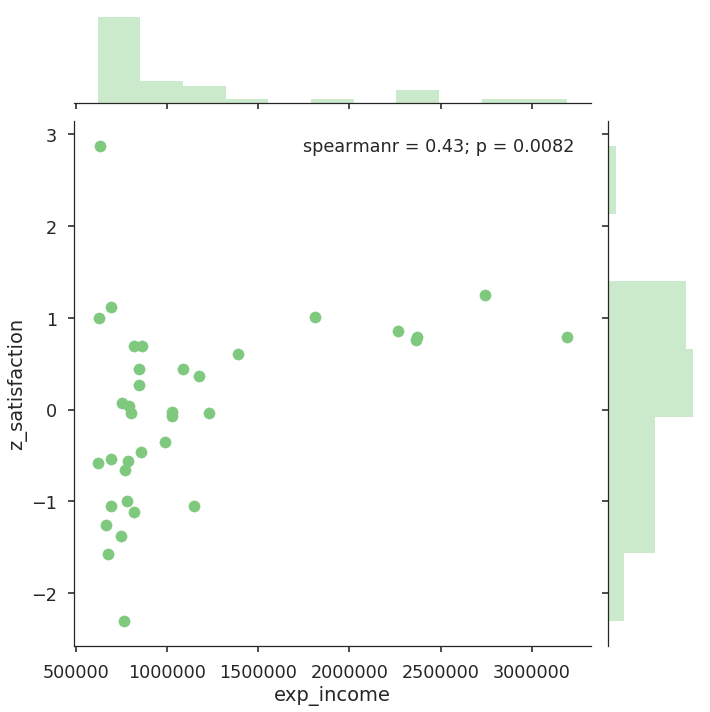

In [50]:
from scipy.stats import spearmanr
sns.jointplot('exp_income', 'z_satisfaction', urban_municipalities, size=10, stat_func=spearmanr)

La correlación muestra resultados coherentes con lo anterior ($p = 0.043$), lo cual es bueno. Muestra que la relación, aunque no es fuerte, es robusta. ¿Qué pasa si evaluamos la correlación logarítmica?

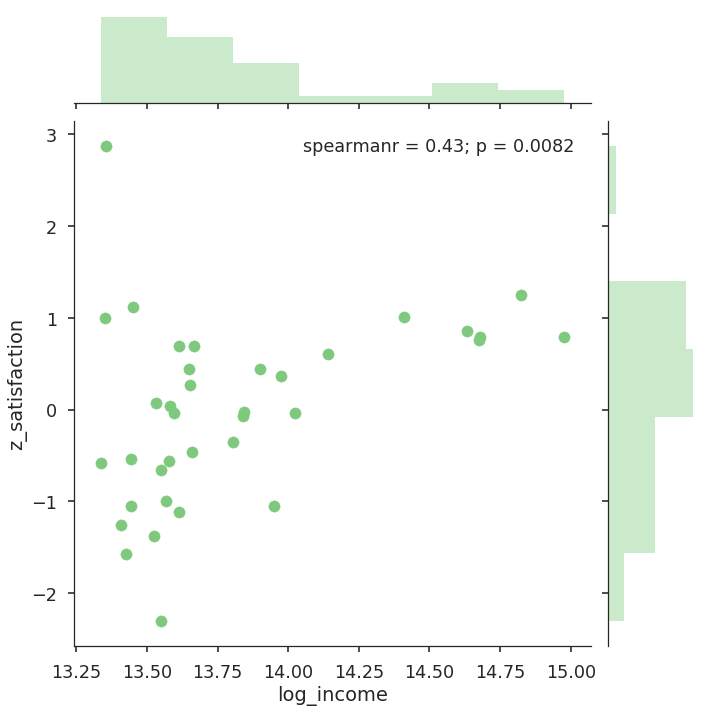

In [51]:
sns.jointplot('log_income', 'z_satisfaction', urban_municipalities, size=10, stat_func=spearmanr)

Observamos que el resultado es idéntico. Esto se debe a que la transformación logarítmica no altera el orden de las variables, y que la correlación comparaba rankings/órdenes.

### Autocorrelación Espacial 

Los dos métodos anteriores son muy usados en estudios científicos. Sin embargo, cuando trabajamos con datos espaciales podemos estar transgrediendo un supuesto fuerte de esos métodos: la **independencia de las observaciones**. ¿Podemos estar seguros que el ingreso o la satisfacción de vida de una comuna no está relacionada con las variables correspondientes de sus comunas vecinas o cercanas?

Si sabemos que existe una dependencia espacial en las variables, entonces no podemos interpretar las medidas de correlación típicas porque los supuestos no eran válidos. La **autocorrelación espacial** nos permitirá saber si la satisfacción o el ingreso tienen una dependencia espacial. Para ello utilizaremos el [coeficiente de autocorrelación espacial I de Moran](https://en.wikipedia.org/wiki/Moran's_I), que, para una variable específica, cuantifica su dependencia espacial. Al igual que los coeficientes anteriores, su valor está dentro del rango $[-1, 1]$.

#### Matriz de Pesos

Lo primero que debemos preguntarnos antes de calcular la I de Moran es: ¿cómo defino si dos observaciones son similares espacialmente? Existen dos tipos de criterios. El primero es _contiguidad_, con diferentes definiciones de contiguidad (o vecindad): comparten al menos un borde, comparten al menos un vértice, o ambas. El segundo es _cercanía_, de acuerdo a alguna definición de distancia y criterios de cercanía. Por ejemplo, ¿se considera el centroide de cada observación?¿Su borde más cercano a la otra observación para la que queremos calcular vecindad?
  
En este ejercicio calcularemos la matriz de vecindad con el criterio de Queen, en el que dos áreas son vecinas si comparten al menos un vértice. La calculamos así, utilizando el módulo de análisis espacial de Python llamado [PySAL](http://pysal.readthedocs.io/):

In [52]:
W = ps.weights.Contiguity.Queen.from_dataframe(urban_municipalities)
W.transform = 'r'
W

Podemos visualizar esta matriz utilizando la función `sns.heatmap` que vimos en el ejercicio anterior:

In [53]:
matrix, labels = W.full()

In [54]:
labels = urban_municipalities.loc[labels]['NOM_COM']

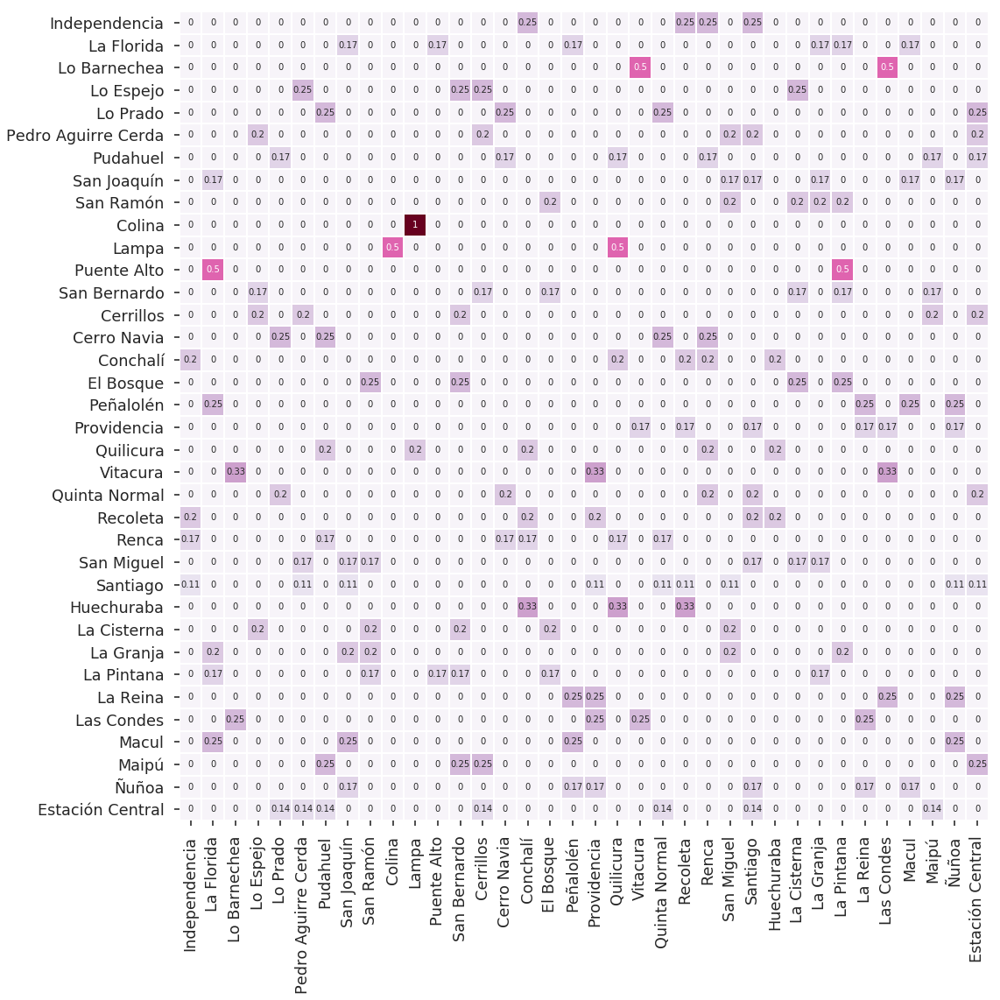

In [55]:
plt.figure(figsize=(17,17))
sns.heatmap(matrix, xticklabels=labels, yticklabels=labels, annot=True, square=True, 
            cbar=False, linewidths=1, cmap='PuRd')

La transformación `r` que aplicamos a la matriz significaba que se debía normalizar por filas (rows). Esto implica que la suma de los pesos en cada fila debe ser $1$. 

#### I de Moran (Moran's I) y Lag Espacial (Spatial Lag).

La I de Moran es definida como la pendiente de una regresión lineal sobre la variable a analizar y el _lag espacial_ de la misma variable.

La definición de _spatial lag_ para la variable $x_i$ es la siguiente:

$$SL(x)_i = \sum_j w_{i,j} x_j$$

Donde $i$ y $j$ son, en nuestro caso, municipalidades, y $w_{i,j}$ es el valor de la matriz de pesos $W$ en la fila de la municipalidad $i$ y la columna de la municipalidad $j$. Por tanto, el _lag espacial_ de $x_i$ es la ponderación de todos los $x$ de las municipalidades vecinas.

PySAL tiene una clase llamada `Moran` que recibe la variable a analizar y la matriz de pesos calculada. Su resultado tiene una variable `I` que contiene el factor de autocorrelación:

In [56]:
moran_income = ps.Moran(urban_municipalities['exp_income'], W)
moran_income.I

0.69974067530719986

$I = 0.7$ es una autocorrelación alta. Esto quiere decir que si una comuna es rica (o pobre), sus vecinas posiblemente también lo son. Podríamos decir que éste es el resultado esperado dada la segregación económica de la ciudad.

Verifiquemos este valor para que entendamos cómo funciona.

Calculamos con el método `lag_spatial` de PySAL:

In [57]:
income_lag = ps.lag_spatial(W, urban_municipalities['exp_income'])
income_lag

array([  875972.36249341,   846796.99285202,  2968952.85812759,
         851338.4167722 ,   751124.23066705,  1016864.67588735,
         866200.57553623,  1285042.60271914,   878912.67875045,
         846064.23089465,   969271.22059499,   845464.31855388,
         873713.01325007,   818064.71075609,   773908.20900771,
         803489.12387232,   798371.91482308,  1706696.34763636,
        2095475.75418642,   770254.99121688,  2308187.95192417,
         881915.53830381,  1179096.10094813,   781070.69774189,
         934590.6567678 ,  1167362.80155807,   819688.24263011,
         853632.37997103,   931981.8424751 ,   773350.84653359,
        2058435.06493285,  2434167.94809853,  1284064.29737548,
         757230.96288066,  1522543.68576145,   904658.01512742])

Calculamos la regresión lineal ($y = ax + b$) utilizando mínimos cuadrados:

In [58]:
a, b = np.polyfit(urban_municipalities['exp_income'], income_lag, 1)
a

0.69974067530719952

:)

Calculemos ahora la I de Moran para la satisfacción con la vida.

In [59]:
moran_satisfaction = ps.Moran(urban_municipalities['z_satisfaction'], W)
moran_satisfaction.I

0.16386667508356872

¡Oh!¡Encontramos que este coeficiente es más bajo! Esto vuelve más interesantes los resultados ya que nos abre puertas para seguir realizando análisis. Tendremos que explorar otras variables en cada comuna (y sus vecinas) que nos permitan saber qué es lo que hace que la población de una comuna se sienta satisfecha con su vida. De momento lo que sabemos es que si miramos a una comuna vecina, no podemos inferir tanto como sí podemos hacerlo con el ingreso.


## Conclusiones

Con esto concluimos este análisis. Aprendimos a hacer mapas de coropletas, incluyendo la carga, filtrado e intersección de áreas geográficas, la asignación y agrupación de variables, y la búsqueda de correlaciones entre ellas. También nos dimos cuenta que en análisis geoespacial es necesario tener cuidado con las relaciones de vecindad de las observaciones.

La correlación existe, sin embargo, explica muy poco respecto a la satisfacción. Es posible que mayor ingreso aumente las probabilidades de satisfacción con la vida a nivel comunal (no estamos analizando personas, sino poblaciones), y ciertamente no hay comunas insatisfechas con bajo ingreso, pero la correlación no es tan alta como esperaríamos si el ingreso fuese el único factor relevante.

Respecto a los datos, visualizamos la segregación económica de la ciudad, y nos dimos cuenta que si dos comunas son vecinas, al saber el ingreso de una de ellas, podemos inferir el ingreso de la otra. Mientras que con la satisfacción con la vida no es así. Al mismo tiempo, parece haber una correlación media-baja entre el ingreso de una comuna y su satisfacción con la vida, pero no podemos concluir más debido a las limitaciones de los métodos que utilizamos.

Más adelante en el curso veremos técnicas de modelamiento y análisis que permitirán superar estas limitaciones.

Ciertamente hay mucho más por hacer. ¿Cómo sugieren continuar?¿Qué variables podríamos incorporar?¿Cómo podríamos incluir otros datasets?¿Cómo podemos evaluar si resultados sorprendentes o inesperados, como la satisfacción de Independencia, son coherentes o más bien son artefactos en los datos?


### Agradecimientos :)

Agradecemos a [César Hidalgo](https://twitter.com/cesifoti) que nos recomendó incluir el análisis de autocorrelación espacial, y a [Leo Ferres](https://twitter.com/leoferres) que notó que usamos un factor de expansión incorrecto para el ingreso (estábamos usando el factor regional en vez del comunal).